# DQC for Player Data

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from plotnine import ggplot, geom_point, aes, facet_wrap, geom_area

## Player Data

### Data Quality Checking

In [2]:
#Load in the match data
df_players = pd.read_csv('../data/PlayerData_v1.csv',index_col=0)
#Limit to pre 2024
df_players = df_players[df_players['Season']<2024]

In [3]:
df_players.info()

<class 'pandas.core.frame.DataFrame'>
Index: 109459 entries, 0 to 111120
Data columns (total 56 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   Player    109459 non-null  object 
 1   Position  109459 non-null  object 
 2   T         109459 non-null  int64  
 3   Ti50      109459 non-null  int64  
 4   PA        109459 non-null  int64  
 5   DHPA      109459 non-null  int64  
 6   S         109459 non-null  int64  
 7   CDOOO     109459 non-null  int64  
 8   CDL       109459 non-null  int64  
 9   CDL%      109459 non-null  float64
 10  Season    109459 non-null  int64  
 11  Round     109459 non-null  object 
 12  D         109459 non-null  int64  
 13  K         109459 non-null  int64  
 14  H         109459 non-null  int64  
 15  i50s      109459 non-null  int64  
 16  DE%       109459 non-null  float64
 17  C         109459 non-null  int64  
 18  R50s      109459 non-null  int64  
 19  EK        109459 non-null  int64  
 20  KE%      

### Investigate missing teams

In [4]:
df_players[df_players['Team'].isna()]['Player'].value_counts()

Player
Jared Jansen    1
Name: count, dtype: int64

Only Jared Jansen remains. Further investigation reveals a row with all 0 stats. We should remove these as to not influence the averages.

In [5]:
df_players[df_players['Team'].isna()]

,Player,Position,T,Ti50,PA,DHPA,S,CDOOO,CDL,CDL%,...,SI,SL,CC,SC,HTA,HTW%,HTA%,RC,lPlayer,Team
29930,Jared Jansen,MID,0,0,0,0,0,0,0,0.0,...,0,0,0,0,0,0.0,0.0,0,jared jansen,NaN


In [6]:
#Create a copy of the dataframe
df_players_temp = df_players.copy(deep=True)
#Get the sum of all numeric stats, check where these are 0
numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
num_cols = df_players_temp.select_dtypes(include=numerics).columns.to_list()
num_cols.remove('Season') #Remove Season since this is not a predictor 
#Create new variable as the sum of all numeric values
#Set as first value:
df_players_temp['Sum_Num'] = df_players_temp['T'] 
for col in num_cols[1:]:
    df_players_temp['Sum_Num'] = df_players_temp['Sum_Num'] + df_players_temp[col]  

In [7]:
#Extract where all num vals are 0
df_players_temp[df_players_temp['Sum_Num']==0]

,Player,Position,T,Ti50,PA,DHPA,S,CDOOO,CDL,CDL%,...,SL,CC,SC,HTA,HTW%,HTA%,RC,lPlayer,Team,Sum_Num
696,David Hille,KEYF,0,0,0,0,0,0,0,0.0,...,0,0,0,0,0.0,0.0,0,david hille,Essendon,0.0
697,Cale Hooker,KEYD,0,0,0,0,0,0,0,0.0,...,0,0,0,0,0.0,0.0,0,cale hooker,Essendon,0.0
715,Henry Slattery,DEF,0,0,0,0,0,0,0,0.0,...,0,0,0,0,0.0,0.0,0,henry slattery,Essendon,0.0
1882,Tom Bellchambers,RUC,0,0,0,0,0,0,0,0.0,...,0,0,0,0,0.0,0.0,0,tom bellchambers,Essendon,0.0
1892,Ricky Dyson,DEF,0,0,0,0,0,0,0,0.0,...,0,0,0,0,0.0,0.0,0,ricky dyson,Essendon,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
107186,Aaron Francis,KEYD,0,0,0,0,0,0,0,0.0,...,0,0,0,0,0.0,0.0,0,aaron francis,Sydney,0.0
108008,Luke Davies-Uniacke,MID,0,0,0,0,0,0,0,0.0,...,0,0,0,0,0.0,0.0,0,luke davies-uniacke,North Melbourne,0.0
108854,Mitch McGovern,DEF,0,0,0,0,0,0,0,0.0,...,0,0,0,0,0.0,0.0,0,mitch mcgovern,Carlton,0.0
109713,Toby McLean,FWD,0,0,0,0,0,0,0,0.0,...,0,0,0,0,0.0,0.0,0,toby mclean,Western Bulldogs,0.0


In [8]:
#Extract where ToG% is 0
df_players_temp[df_players_temp['ToG%']==0]

,Player,Position,T,Ti50,PA,DHPA,S,CDOOO,CDL,CDL%,...,SL,CC,SC,HTA,HTW%,HTA%,RC,lPlayer,Team,Sum_Num
696,David Hille,KEYF,0,0,0,0,0,0,0,0.0,...,0,0,0,0,0.0,0.0,0,david hille,Essendon,0.0
697,Cale Hooker,KEYD,0,0,0,0,0,0,0,0.0,...,0,0,0,0,0.0,0.0,0,cale hooker,Essendon,0.0
715,Henry Slattery,DEF,0,0,0,0,0,0,0,0.0,...,0,0,0,0,0.0,0.0,0,henry slattery,Essendon,0.0
1882,Tom Bellchambers,RUC,0,0,0,0,0,0,0,0.0,...,0,0,0,0,0.0,0.0,0,tom bellchambers,Essendon,0.0
1892,Ricky Dyson,DEF,0,0,0,0,0,0,0,0.0,...,0,0,0,0,0.0,0.0,0,ricky dyson,Essendon,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
107186,Aaron Francis,KEYD,0,0,0,0,0,0,0,0.0,...,0,0,0,0,0.0,0.0,0,aaron francis,Sydney,0.0
108008,Luke Davies-Uniacke,MID,0,0,0,0,0,0,0,0.0,...,0,0,0,0,0.0,0.0,0,luke davies-uniacke,North Melbourne,0.0
108854,Mitch McGovern,DEF,0,0,0,0,0,0,0,0.0,...,0,0,0,0,0.0,0.0,0,mitch mcgovern,Carlton,0.0
109713,Toby McLean,FWD,0,0,0,0,0,0,0,0.0,...,0,0,0,0,0.0,0.0,0,toby mclean,Western Bulldogs,0.0


Given ToG% = 0 for these cases, it means the player did not play in this match, as such their scores should not be used in the aggregates.

## Numerical Variables

In [10]:
with pd.option_context('display.max_column', None):
    print(df_players.describe())

                   T           Ti50             PA           DHPA  \
count  109459.000000  109459.000000  109459.000000  109459.000000   
mean        2.810788       0.474013      12.470514       5.857079   
std         2.263737       0.836137       6.515109       3.838999   
min         0.000000       0.000000       0.000000       0.000000   
25%         1.000000       0.000000       8.000000       3.000000   
50%         2.000000       0.000000      12.000000       5.000000   
75%         4.000000       1.000000      16.000000       8.000000   
max        20.000000      10.000000      49.000000      31.000000   

                   S          CDOOO            CDL           CDL%  \
count  109459.000000  109459.000000  109459.000000  109459.000000   
mean        1.497355       0.734631       0.202779       9.845767   
std         2.122989       1.402781       0.535866      26.008202   
min         0.000000       0.000000       0.000000       0.000000   
25%         0.000000       0.0000

### Define Numerical Round Variable for Plots 

In [11]:
df_players_temp['Round'].unique()

array(['Finals Week 1', 'Grand Final', 'Preliminary Finals', 'Round 10',
       'Round 11', 'Round 12', 'Round 13', 'Round 14', 'Round 15',
       'Round 16', 'Round 17', 'Round 18', 'Round 19', 'Round 1',
       'Round 20', 'Round 21', 'Round 22', 'Round 23', 'Round 2',
       'Round 3', 'Round 4', 'Round 5', 'Round 6', 'Round 7', 'Round 8',
       'Round 9', 'Semi Finals', 'Round 24'], dtype=object)

Note the labelling of the Round variable is different herre than in the matches data frame. Will need to make them consistent for joining. Seems to be as follows:

- **Finals Week 1**: Qualifying/Elimination.
- **Semi**: removed plural.
- **Prelim**: removed plural.
- **Grand**: same.

In [12]:
df_players_temp['RoundNum'] = df_players_temp['Round'].str.extract(r'(\d+)')
df_players_temp['RoundNum'] = pd.to_numeric(df_players_temp['RoundNum'],errors='coerce')
df_players_temp.loc[df_players_temp['Round']=='Finals Week 1','RoundNum'] = 100
df_players_temp.loc[df_players_temp['Round']=='Semi Finals','RoundNum'] = 102
df_players_temp.loc[df_players_temp['Round']=='Preliminary Finals','RoundNum'] = 103
df_players_temp.loc[df_players_temp['Round']=='Grand Final','RoundNum'] = 104

In [13]:
#Extract only numeric values
num_cols = df_players_temp.select_dtypes(include=numerics).columns.to_list()
df_numeric = df_players_temp[num_cols]

## Volumes over time (by Round)

<Axes: xlabel='Season,RoundNum'>

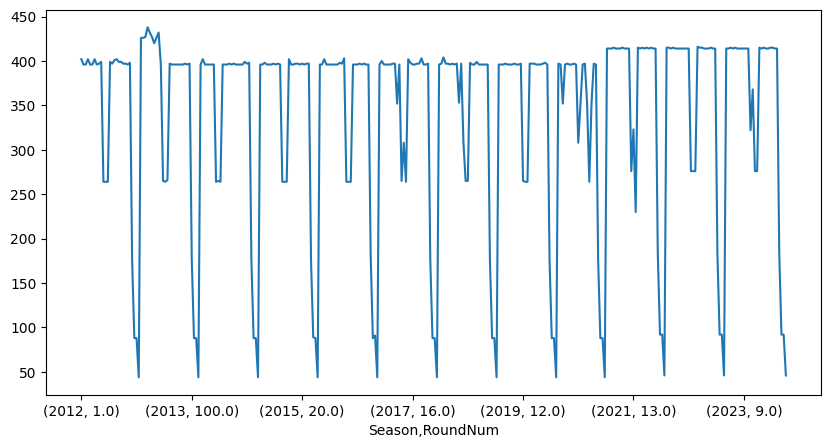

In [14]:
df_players_temp[['Season','RoundNum','Player']].groupby(['Season','RoundNum']).agg('count').plot(figsize=(10,5),legend=False)

## Volumes over time (by Season)

<Axes: xlabel='Season'>

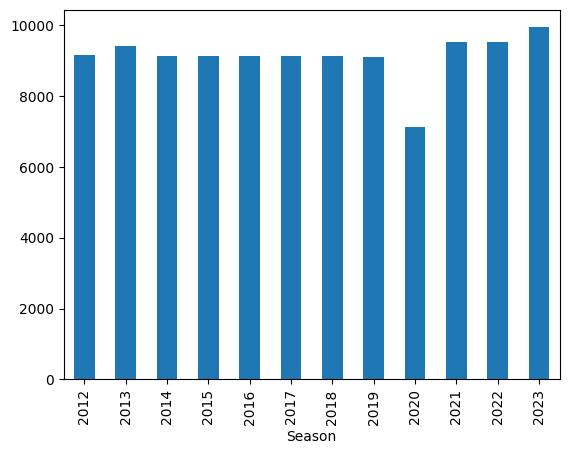

In [15]:
df_players_temp[['Season','Player']].groupby(['Season']).agg('count').plot(kind='bar',legend=False)

Consistent volumes with match data.

### Numerical values over time 

In [16]:
#Prepare for plotting and aggregate 
df_num_means = df_numeric.groupby(['Season','RoundNum']).agg('mean')
#Remove the time variables from the list for looping
num_cols.remove('Season')
num_cols.remove('RoundNum')

#### Aggregate by Round

C:\Users\Adam\AppData\Local\Temp\ipykernel_123728\1383827293.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.


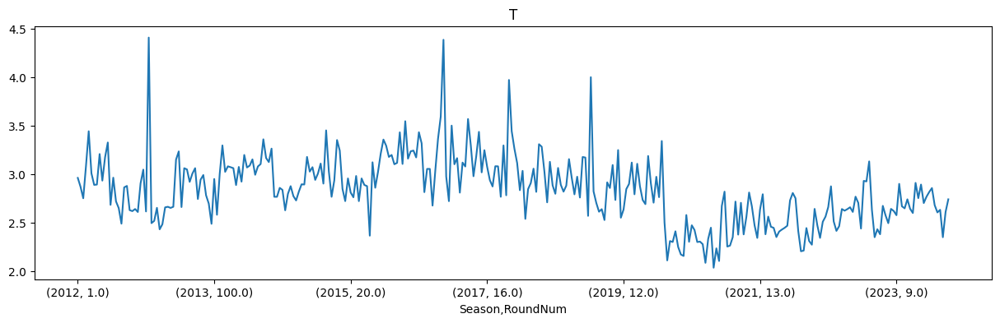

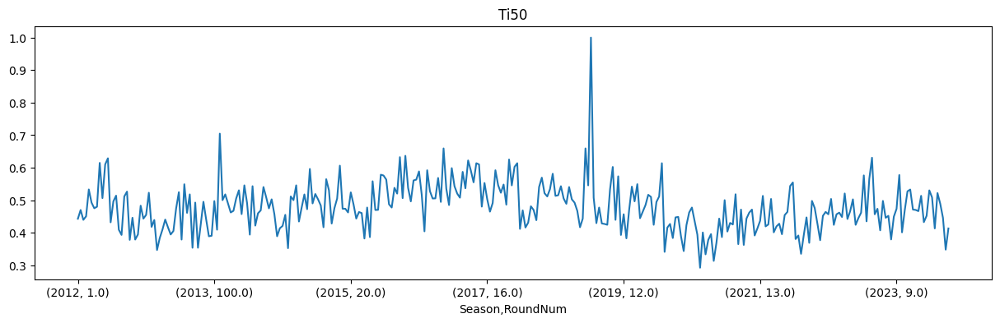

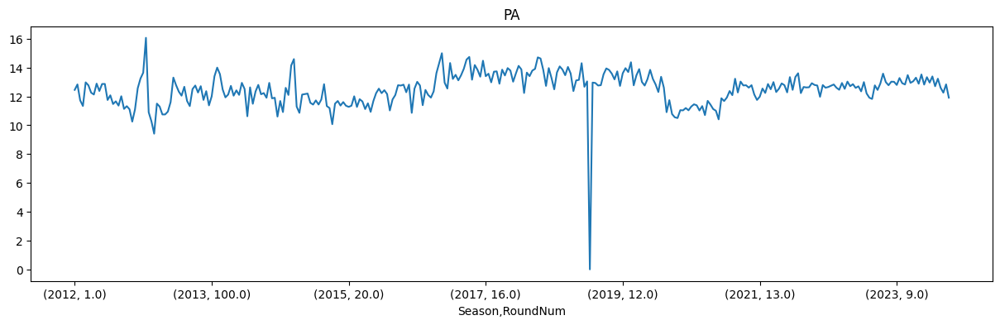

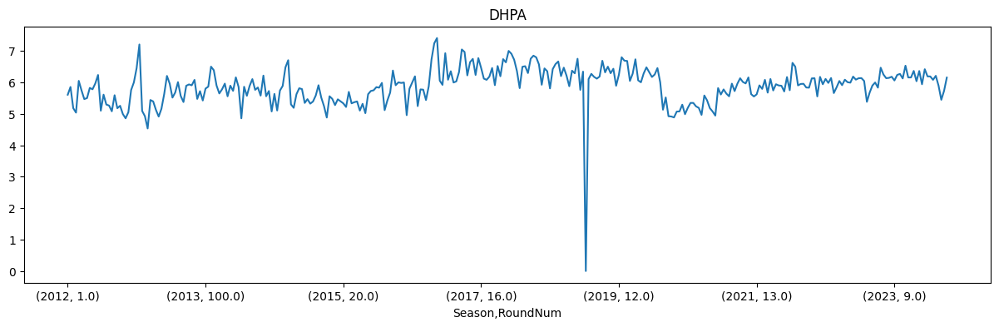

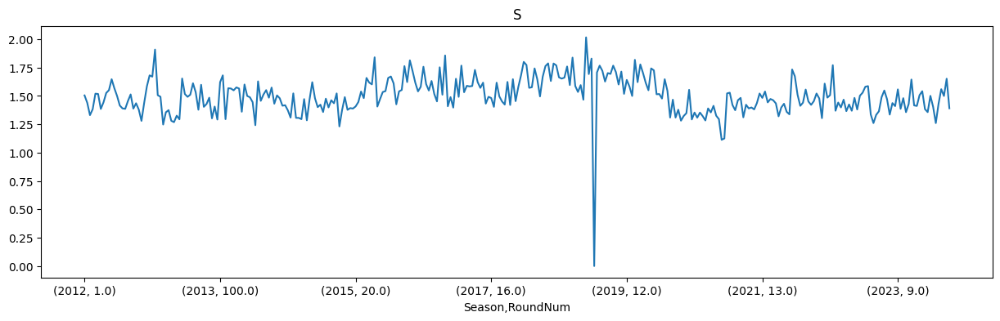

...

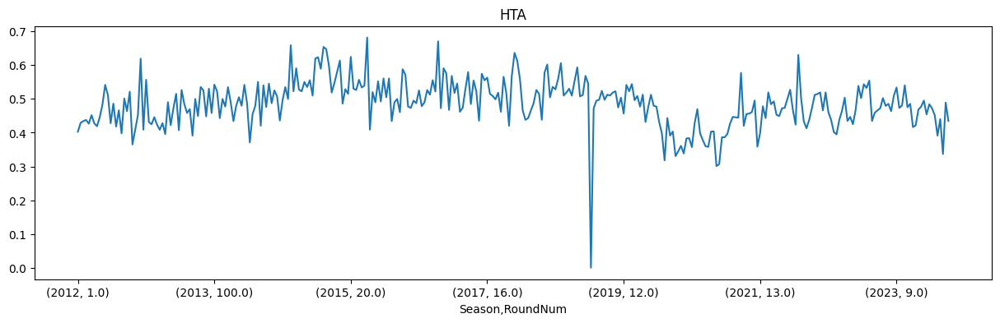

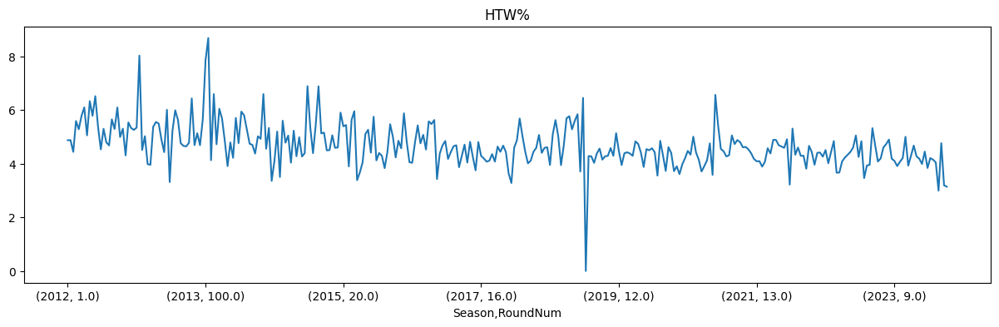

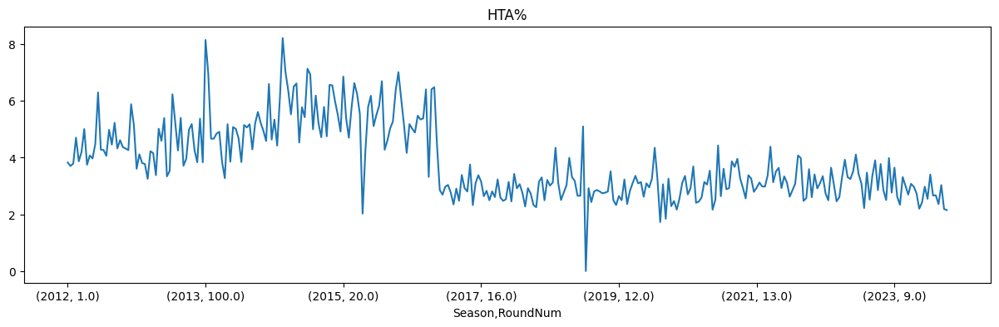

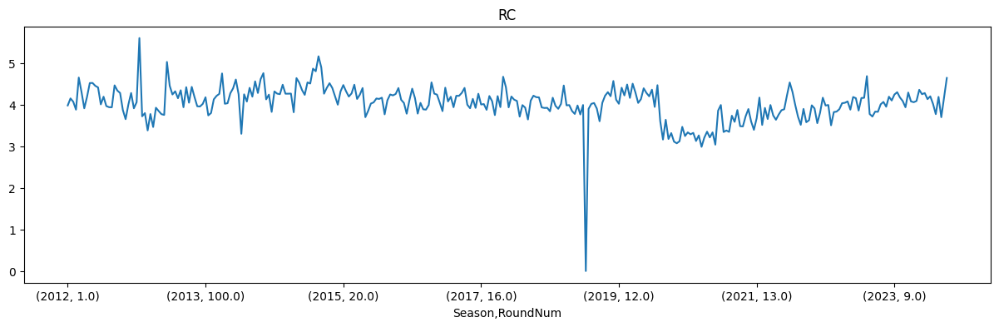

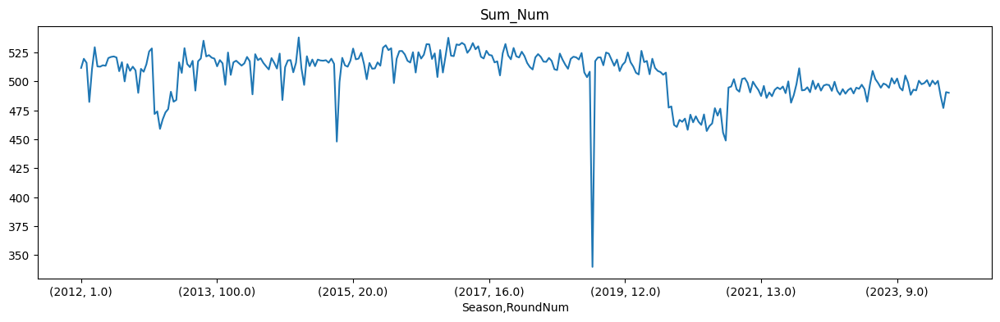

In [17]:
for val in num_cols:
    plt.figure(figsize=(15,4))
    plt.title(val)
    df_num_means[val].plot()

#### Aggregate by Round (removing all 0s)

C:\Users\Adam\AppData\Local\Temp\ipykernel_123728\1532933160.py:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.


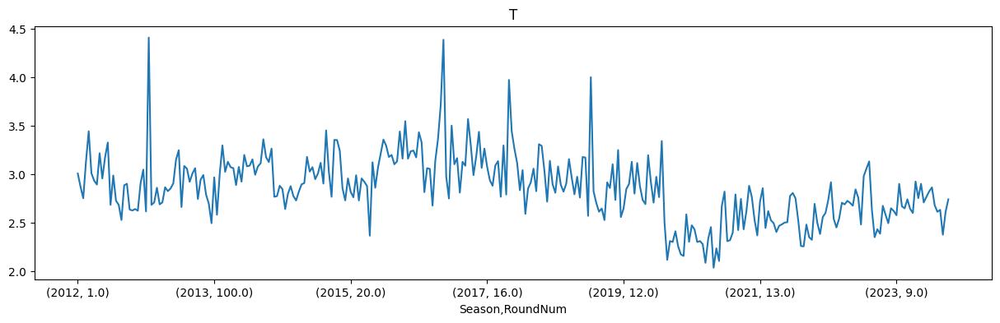

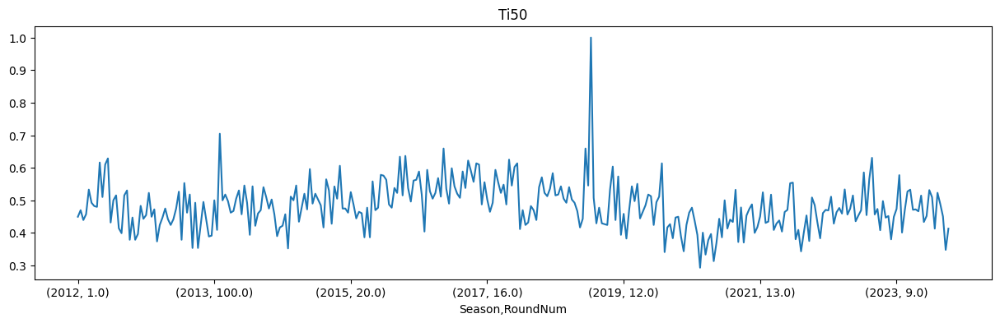

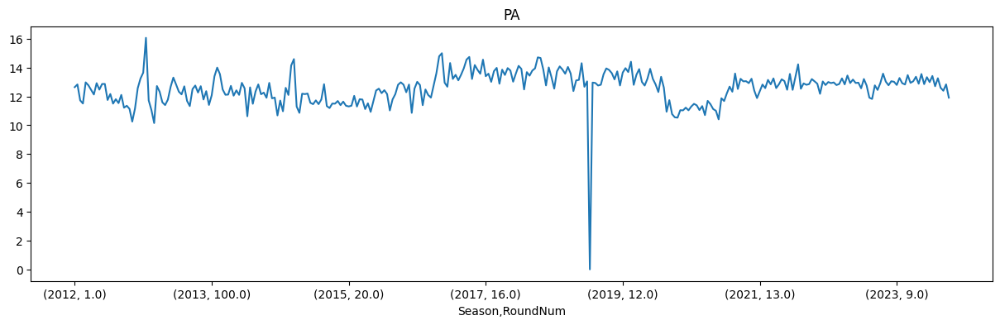

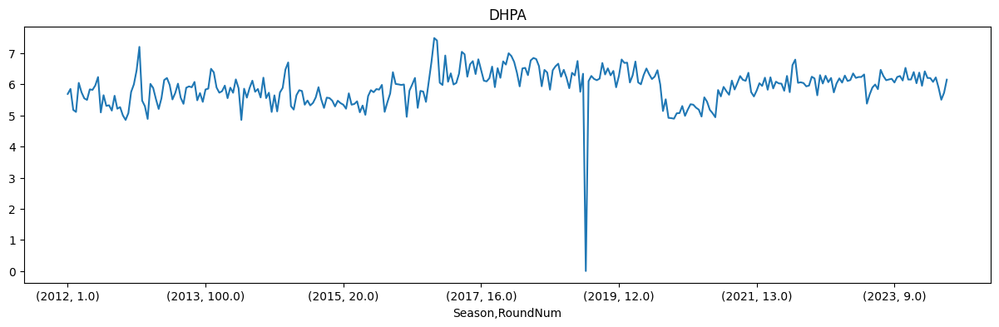

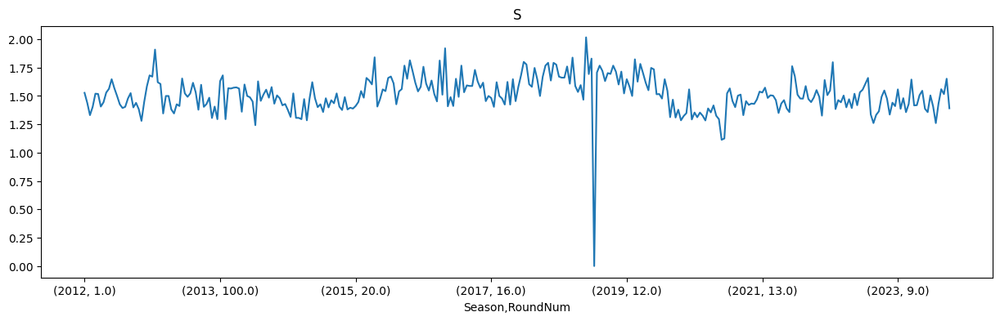

...

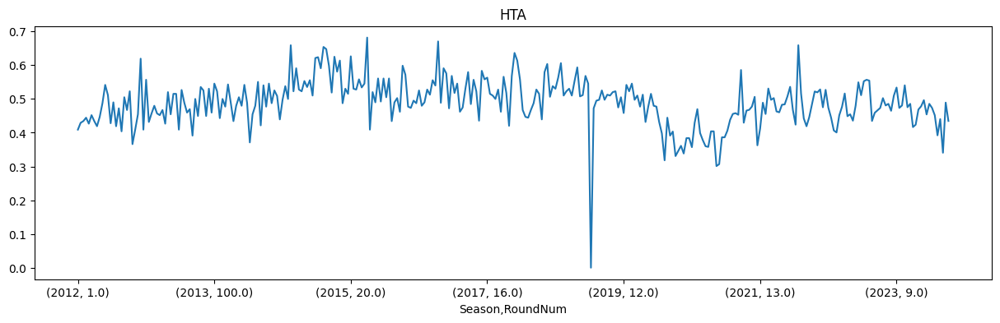

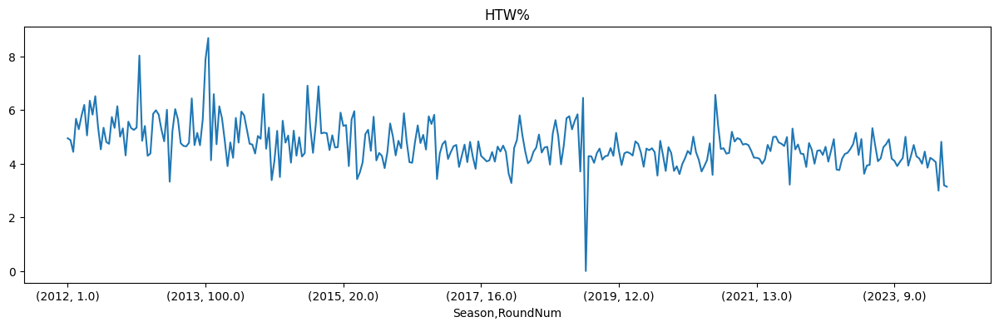

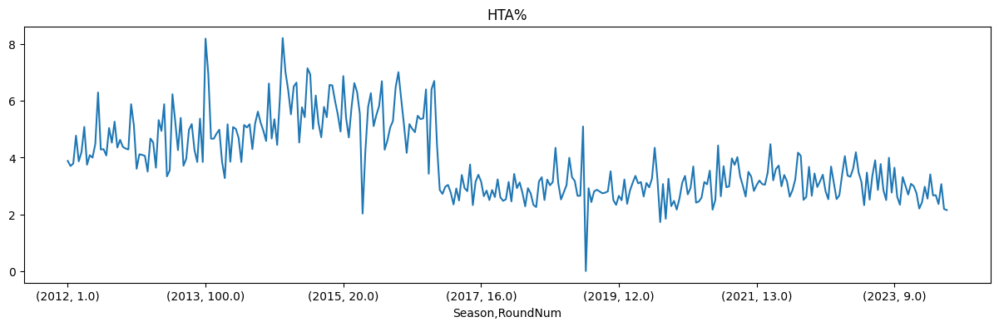

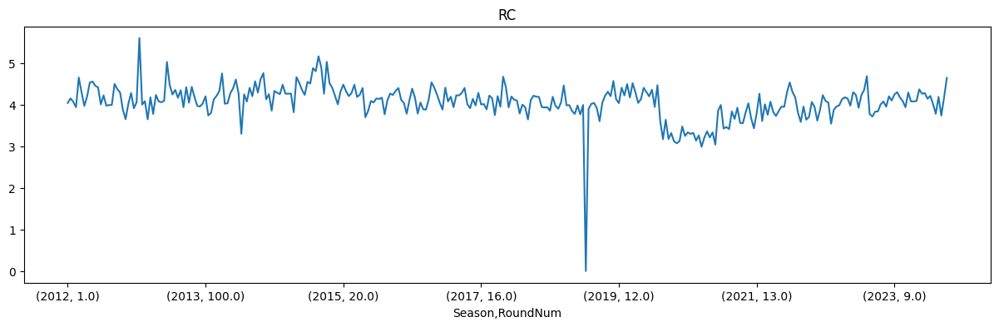

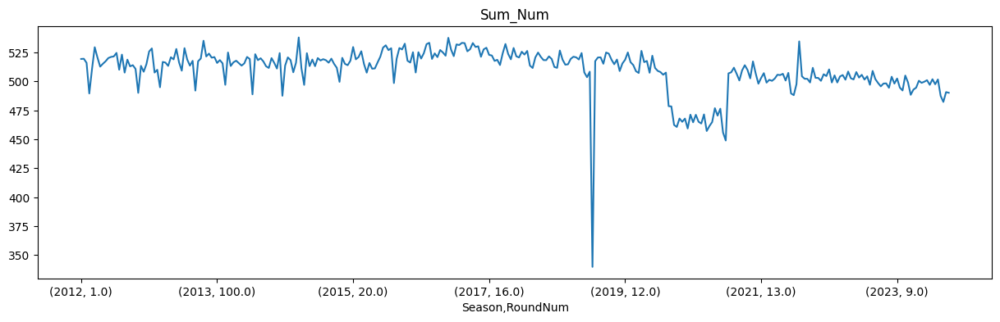

In [18]:
#Extract only numeric values
num_cols = df_players_temp.select_dtypes(include=numerics).columns.to_list()
df_numeric = df_players_temp[num_cols]

#Prepare for plotting and aggregate 
df_num_means = df_numeric[df_numeric['ToG%']>0].groupby(['Season','RoundNum']).agg('mean')
#Remove the time variables from the list for looping
num_cols.remove('Season')
num_cols.remove('RoundNum')

for val in num_cols:
    plt.figure(figsize=(15,4))
    plt.title(val)
    df_num_means[val].plot()



#### Aggregate by Season

In [19]:
#Prepare for plotting and aggregate 
df_num_means = df_numeric.groupby(['Season']).agg('mean')

C:\Users\Adam\AppData\Local\Temp\ipykernel_123728\1383827293.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.


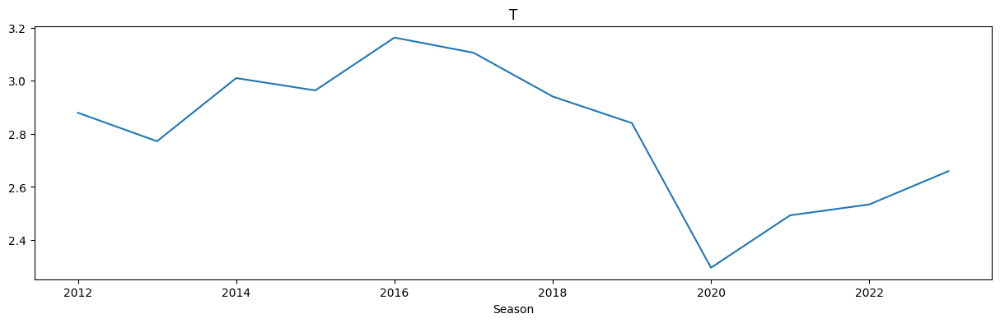

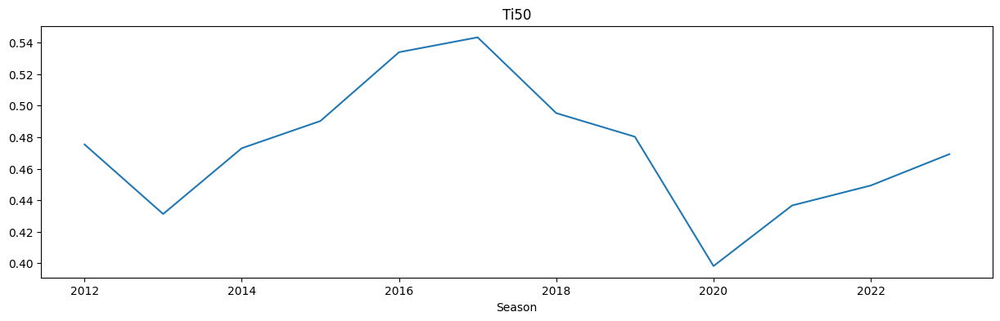

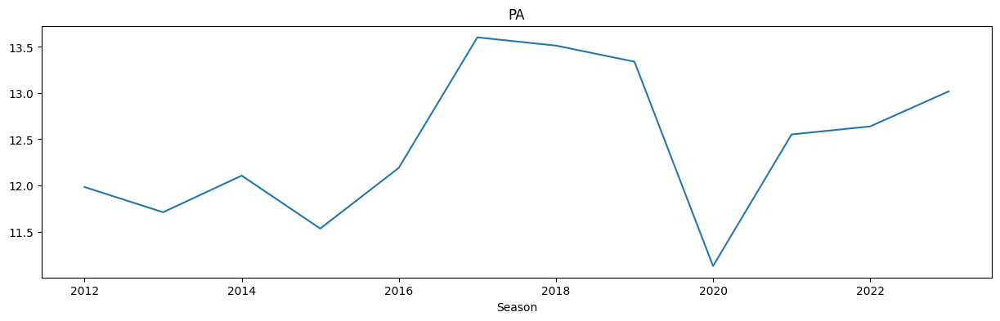

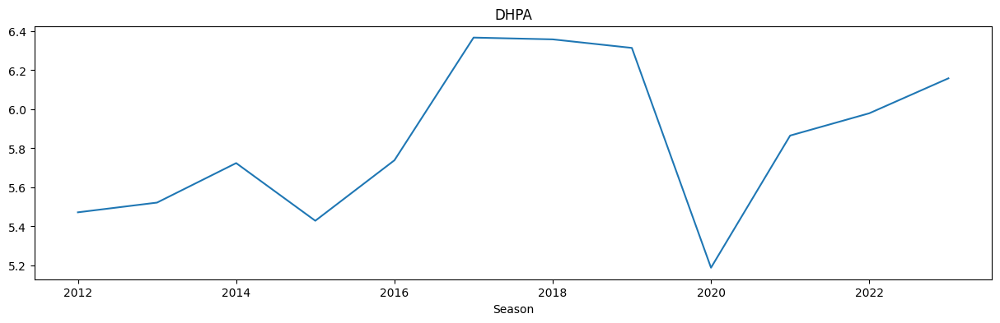

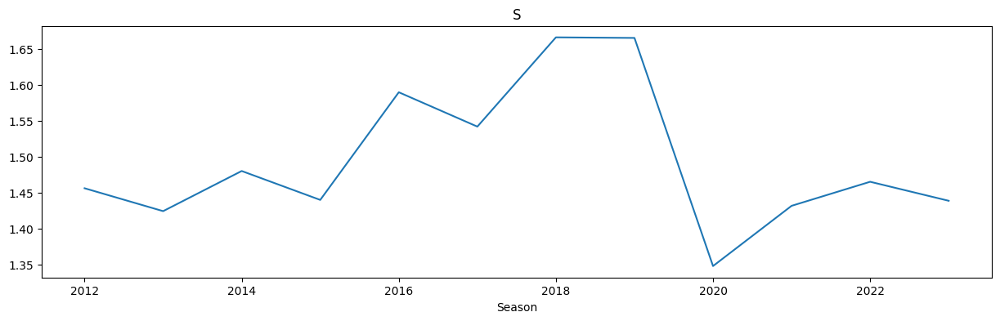

...

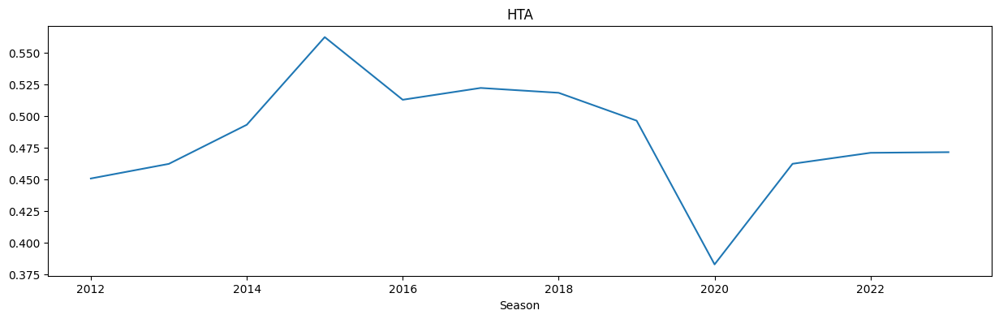

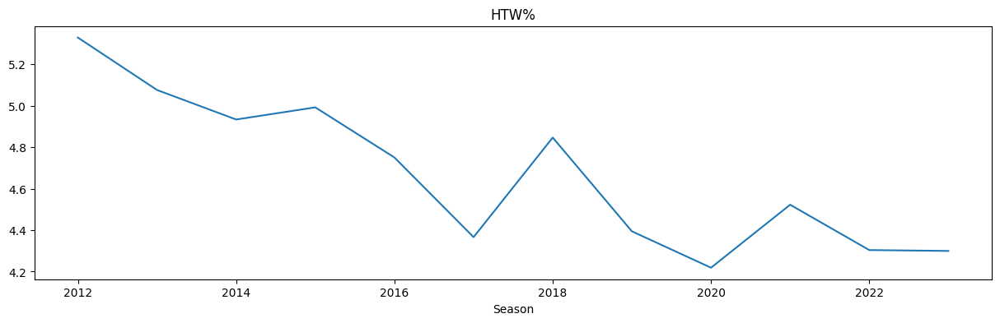

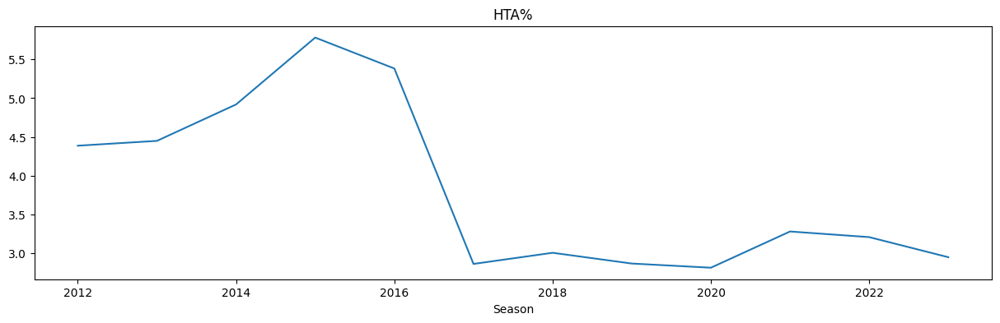

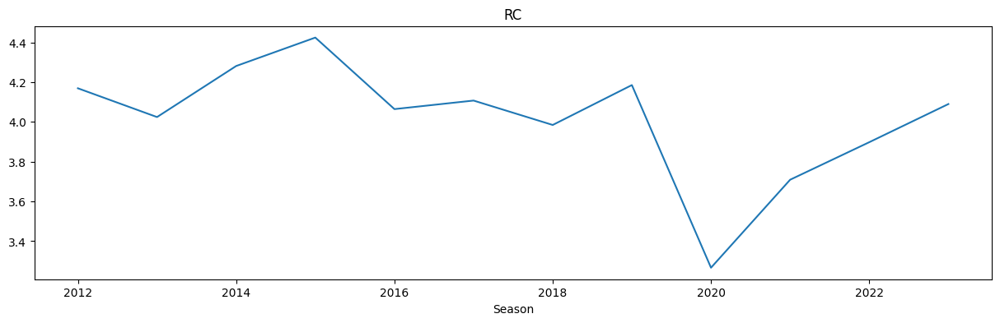

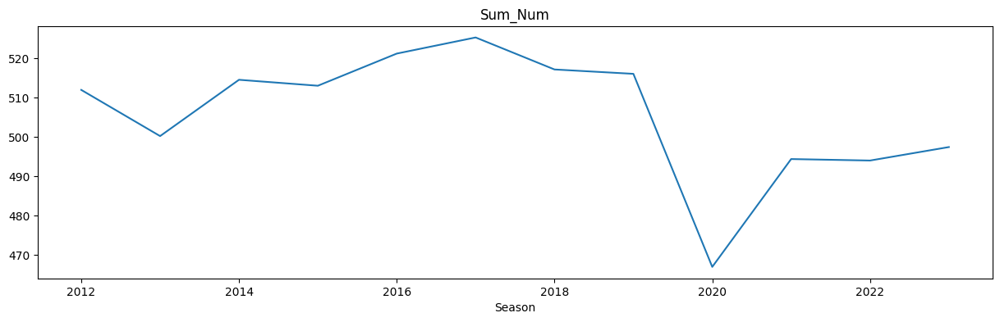

In [20]:
for val in num_cols:
    plt.figure(figsize=(15,4))
    plt.title(val)
    df_num_means[val].plot()

We note at roundly aggregation a few spikes towards zero, however, removing Sum_Num == 0 did not rectify these spikes, so we will keep these players in. We also note a decrease in performance for many stats during the covid period.

#### Histograms

C:\Users\Adam\AppData\Local\Temp\ipykernel_123728\1075054865.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.


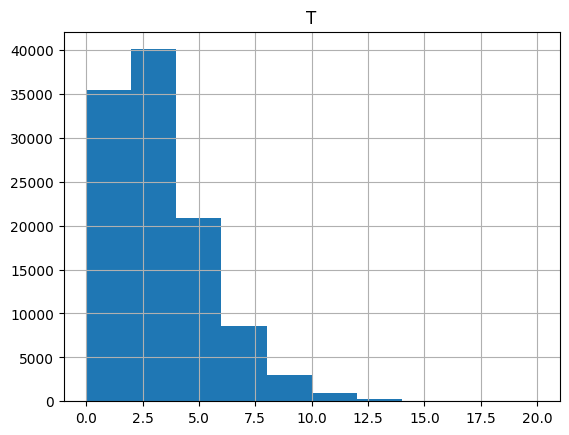

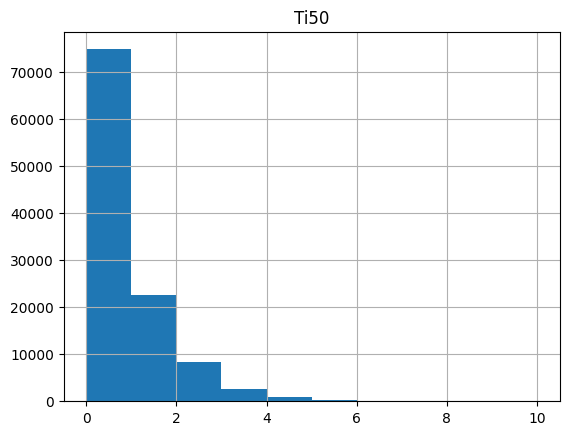

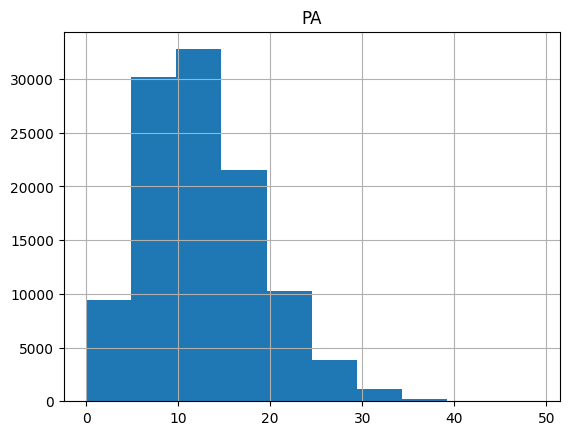

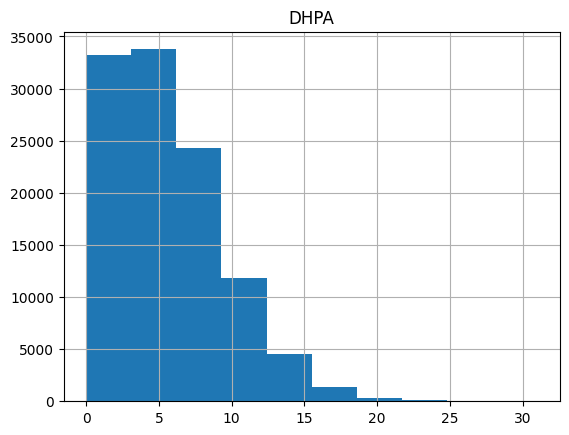

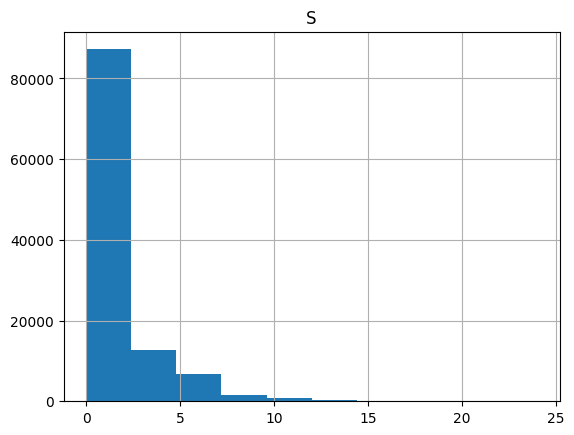

...

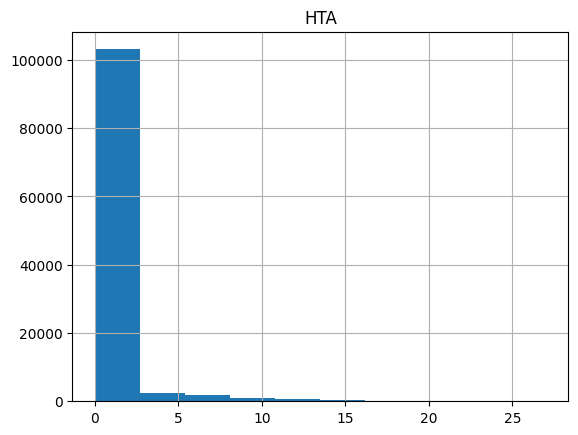

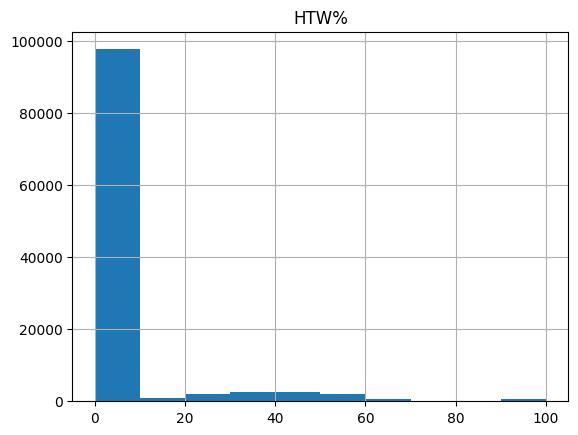

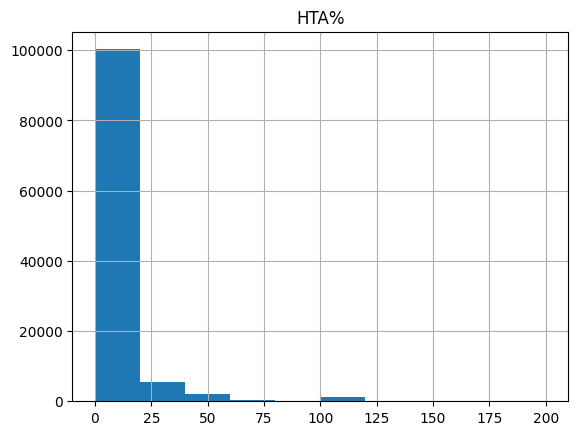

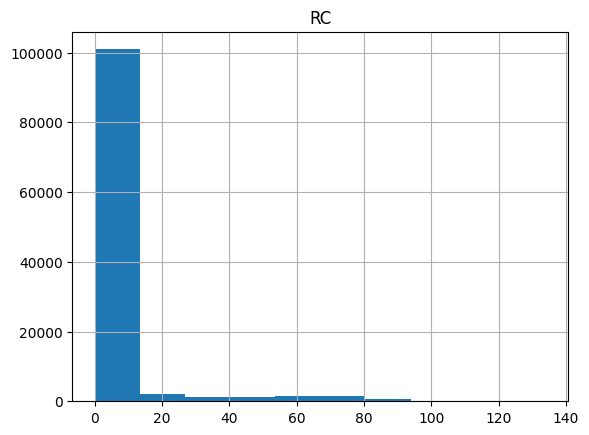

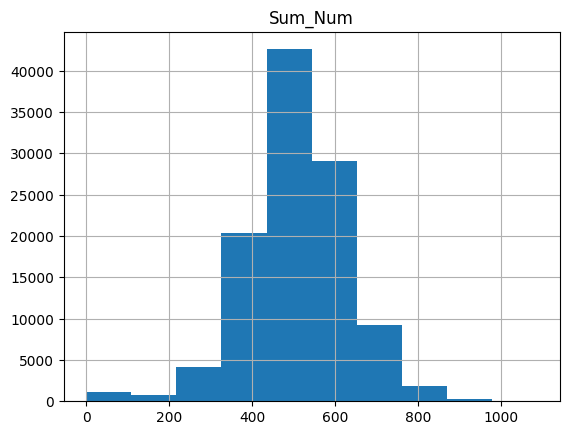

In [21]:
for val in num_cols:
    plt.figure()
    plt.title(val)
    df_players_temp[val].hist()

We see a mix of exponential, gamma and t/normal distributions.

### Outlier Checks by Season

In [22]:
#Add Season back to the numeric cols list
num_cols.append('Season')
df_numeric_box = df_numeric[num_cols]
num_cols.remove('Season')
df_numeric_box = df_numeric_box.dropna()

C:\Users\Adam\AppData\Local\Temp\ipykernel_123728\137008382.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.


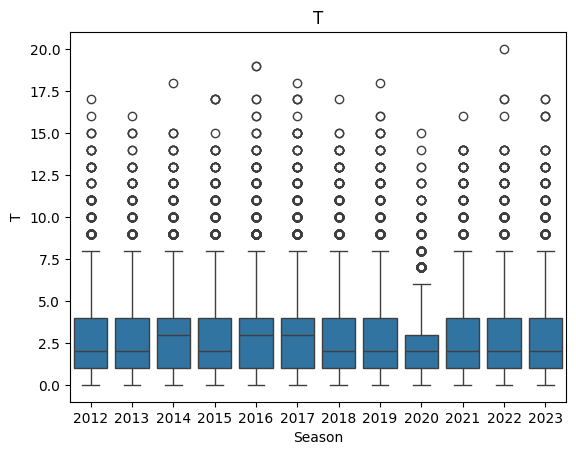

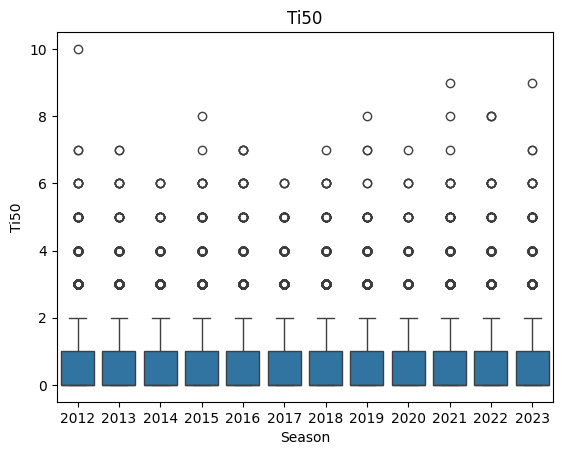

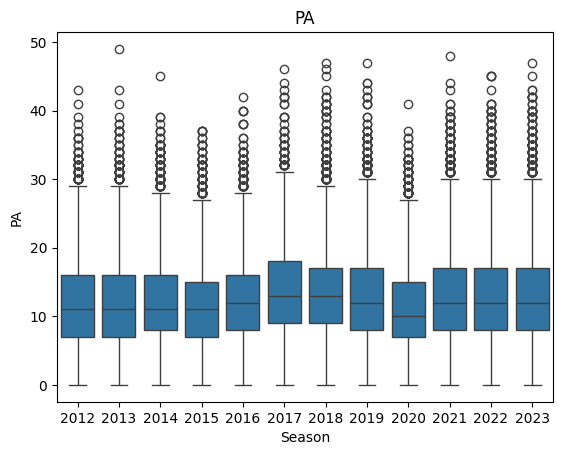

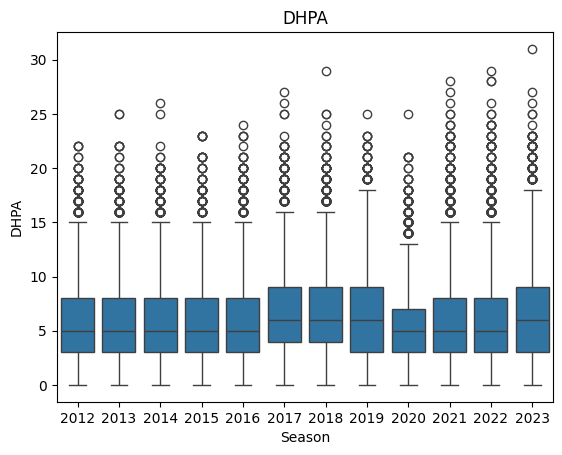

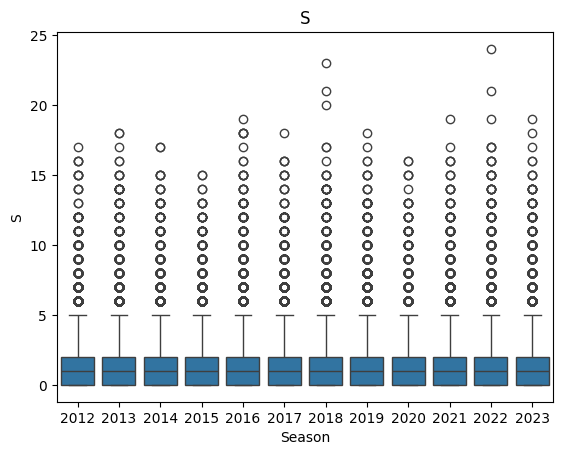

...

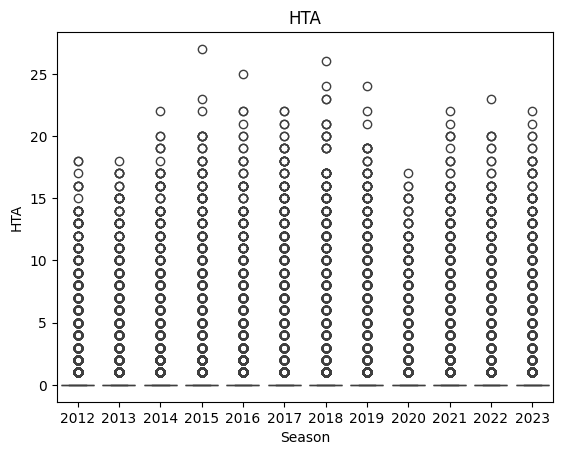

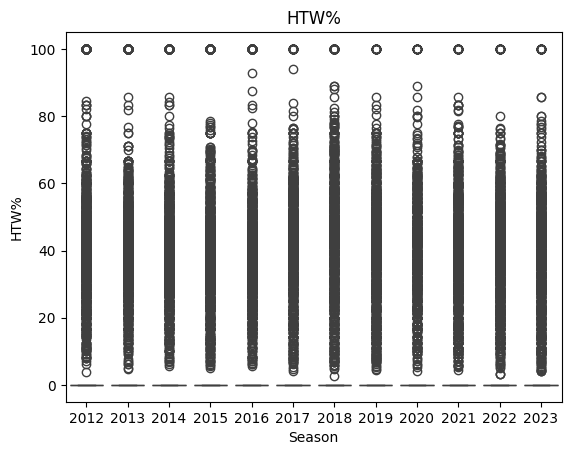

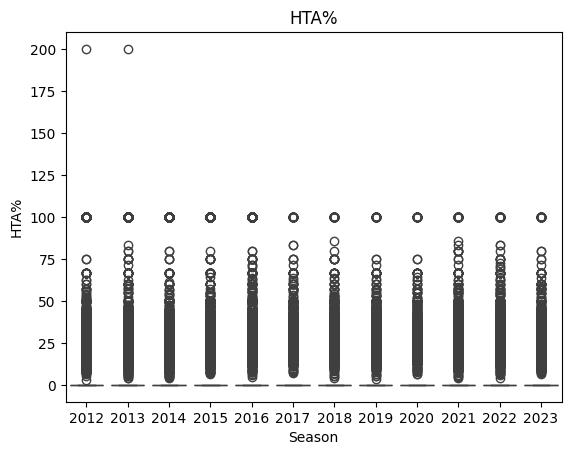

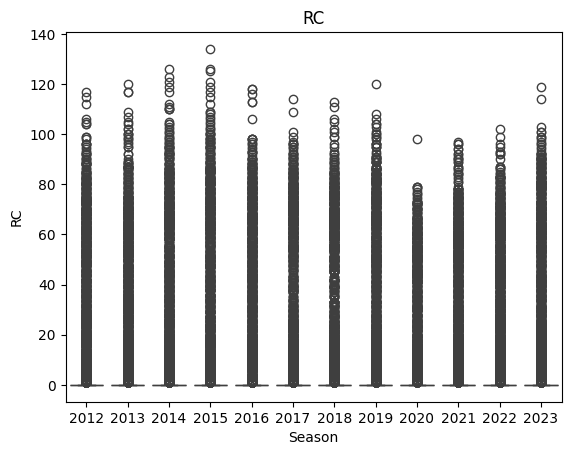

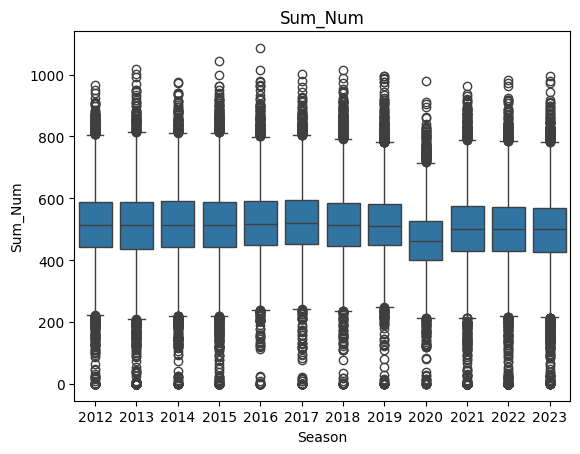

In [23]:
#Create boxplots over time for each numeric variable
for val in num_cols:
    plt.figure()
    plt.title(val)
    sns.boxplot(data=df_numeric_box.dropna(),x='Season',y=val)

Outliers of note:

- **Effective Kicks**: Season 2016 > 35.
- **R**: Season 2012 > 50.
- **G**: Season 2012 > 12.
- **IP**: Seasons 2012, 2016, 2023. > 20.
- **SAG**: Seasons 2012, 2023. > 17.5.
- **SL**: Season 2022 > 11
- **HTA%**: Seasons 2012 and 2013: >190.


Additionally, GA was much poorer in 2020.

#### Effective Kicks (EK)

In [24]:
with pd.option_context('display.max_column', None):
    print(df_players_temp[(df_players_temp['Season']==2016)&(df_players_temp['EK']>35)])  

           Player Position  T  Ti50  PA  DHPA  S  CDOOO  CDL  CDL%  Season  \
46132  Heath Shaw      DEF  6     0   9     6  5      2    0   0.0    2016   

         Round   D   K  H  i50s   DE%  C  R50s  EK    KE%   KHB  ED  FF  FA  \
46132  Round 9  38  36  2     2  97.4  2    14  36  100.0  18.0  37   1   1   

        AF  B  OP  ToG%     R  G   M  HO  Mi50  CM  MOL  IM  CP  UP  IP   CPR  \
46132  176  9   5    96  27.6  0  14   0     0   0    0   1   5  26   8  16.1   

       GBG  F50GBG  GA  GA%  SAG  SI  SL  CC  SC  HTA  HTW%  HTA%  RC  \
46132    4       0   0  0.0    0   4   3   0   0    0   0.0   0.0   0   

          lPlayer                    Team  Sum_Num  RoundNum  
46132  heath shaw  Greater Western Sydney    807.1       9.0  


####  Rating Points (R)

In [25]:
with pd.option_context('display.max_column', None):
    print(df_players_temp[(df_players_temp['Season']==2012)&(df_players_temp['R']>50)])  

             Player Position  T  Ti50  PA  DHPA  S  CDOOO  CDL  CDL%  Season  \
351  Lance Franklin     KEYF  6     6  13     1  0      0    0   0.0    2012   

        Round   D   K  H  i50s   DE%  C  R50s  EK   KE%   KHB  ED  FF  FA  \
351  Round 10  23  22  1     4  69.6  4     0  15  68.2  22.0  16   3   2   

      AF  B  OP  ToG%     R   G   M  HO  Mi50  CM  MOL  IM  CP  UP  IP   CPR  \
351  204  0   2    93  50.5  13  11   0     9   4    7   0   9  14   2  39.1   

     GBG  F50GBG  GA   GA%  SAG  SI  SL  CC  SC  HTA  HTW%  HTA%  RC  \
351    1       1   1  72.2   18  19   1   0   0    0   0.0   0.0   0   

            lPlayer      Team  Sum_Num  RoundNum  
351  lance franklin  Hawthorn    846.6      10.0  


#### Goals (worth 6 points) (G)

In [26]:
with pd.option_context('display.max_column', None):
    print(df_players_temp[(df_players_temp['Season']==2012)&(df_players_temp['G']>12)])  

             Player Position  T  Ti50  PA  DHPA  S  CDOOO  CDL  CDL%  Season  \
351  Lance Franklin     KEYF  6     6  13     1  0      0    0   0.0    2012   

        Round   D   K  H  i50s   DE%  C  R50s  EK   KE%   KHB  ED  FF  FA  \
351  Round 10  23  22  1     4  69.6  4     0  15  68.2  22.0  16   3   2   

      AF  B  OP  ToG%     R   G   M  HO  Mi50  CM  MOL  IM  CP  UP  IP   CPR  \
351  204  0   2    93  50.5  13  11   0     9   4    7   0   9  14   2  39.1   

     GBG  F50GBG  GA   GA%  SAG  SI  SL  CC  SC  HTA  HTW%  HTA%  RC  \
351    1       1   1  72.2   18  19   1   0   0    0   0.0   0.0   0   

            lPlayer      Team  Sum_Num  RoundNum  
351  lance franklin  Hawthorn    846.6      10.0  


#### Intercept Possessions (IP)

In [27]:
with pd.option_context('display.max_column', None):
    print(df_players_temp[(df_players_temp['Season'].isin([2012,2016,2023]))&(df_players_temp['IP']>20)])  

                   Player Position  T  Ti50  PA  DHPA   S  CDOOO  CDL  CDL%  \
5905    Scott D. Thompson     KEYD  1     0  13    10  10      3    2  66.7   
44808     Jeremy McGovern     KEYD  1     0   2     2  10      8    0   0.0   
101741       James Sicily     KEYD  1     0   5     5   3      3    0   0.0   

        Season     Round   D   K   H  i50s   DE%  C  R50s  EK   KE%  KHB  ED  \
5905      2012  Round 23  39  18  21     1  87.2  3     8  13  72.2  0.9  34   
44808     2016   Round 5  23  14   9     3  78.3  2     2  11  78.6  1.6  18   
101741    2023  Round 11  43  24  19     3  90.7  6     6  20  83.3  1.3  39   

        FF  FA   AF  B  OP  ToG%     R  G   M  HO  Mi50  CM  MOL  IM  CP  UP  \
5905     3   1  139  7  10    98  29.6  0  13   0     0   3    0   6  21  17   
44808    4   0   83  0  12    81  27.6  0   5   0     0   4    0   5  19   4   
101741   2   0  165  2   4    93  23.5  0  16   0     0   4    0   8  17  22   

        IP   CPR  GBG  F50GBG  GA  GA%  S

The possession stats here seem reasonable.

#### Shots at Goal (SAG)

In [28]:
with pd.option_context('display.max_column', None):
    print(df_players_temp[(df_players_temp['Season'].isin([2012,2023]))&(df_players_temp['SAG']>17)])  

                Player Position  T  Ti50  PA  DHPA  S  CDOOO  CDL  CDL%  \
351     Lance Franklin     KEYF  6     6  13     1  0      0    0   0.0   
107068   Taylor Walker     KEYF  2     1  13     1  0      0    0   0.0   

        Season     Round   D   K  H  i50s   DE%  C  R50s  EK   KE%   KHB  ED  \
351       2012  Round 10  23  22  1     4  69.6  4     0  15  68.2  22.0  16   
107068    2023  Round 24  21  20  1     2  47.6  4     0  10  50.0  20.0  10   

        FF  FA   AF  B  OP  ToG%     R   G   M  HO  Mi50  CM  MOL  IM  CP  UP  \
351      3   2  204  0   2    93  50.5  13  11   0     9   4    7   0   9  14   
107068   1   1  164  0   1    89  31.7   9  11   5    10   3    4   0  10  12   

        IP   CPR  GBG  F50GBG  GA   GA%  SAG  SI  SL  CC  SC  HTA  HTW%  HTA%  \
351      2  39.1    1       1   1  72.2   18  19   1   0   0    0   0.0   0.0   
107068   0  45.5    3       2   0  47.4   19  14   2   0   2    1  38.5  20.0   

        RC         lPlayer      Team  Sum_Num

#### Score Launch (SL)

In [29]:
with pd.option_context('display.max_column', None):
    print(df_players_temp[(df_players_temp['Season'].isin([2022]))&(df_players_temp['SL']>11)])  

           Player Position  T  Ti50  PA  DHPA  S  CDOOO  CDL  CDL%  Season  \
91606  Matt Flynn      RUC  2     0  10     7  0      0    0   0.0    2022   

          Round   D  K   H  i50s   DE%  C  R50s  EK   KE%  KHB  ED  FF  FA  \
91606  Round 10  18  8  10     1  55.6  2     0   3  37.5  0.8  10   0   1   

        AF  B  OP  ToG%     R  G  M  HO  Mi50  CM  MOL  IM  CP  UP  IP   CPR  \
91606  106  0   3    72  15.4  0  5  41     2   1    0   2  12   8   5  60.0   

       GBG  F50GBG  GA  GA%  SAG  SI  SL  CC  SC  HTA  HTW%  HTA%  RC  \
91606    8       1   0  0.0    1  14  12   0   2   14  60.3  34.1  68   

          lPlayer                    Team  Sum_Num  RoundNum  
91606  matt flynn  Greater Western Sydney    712.7      10.0  


#### (Hitouts to Advantage%) HTA%

In [30]:
with pd.option_context('display.max_column', None):
    print(df_players_temp[(df_players_temp['Season'].isin([2012,2013]))&(df_players_temp['HTA%']>190)])  

            Player Position  T  Ti50  PA  DHPA  S  CDOOO  CDL  CDL%  Season  \
8563      Ben Reid     KEYD  3     0   3     3  8      5    0   0.0    2012   
9334  Mitch Duncan      MID  3     0  20     7  0      0    0   0.0    2013   

              Round   D   K  H  i50s   DE%  C  R50s  EK   KE%  KHB  ED  FF  \
8563        Round 8  15  12  3     0  86.7  2     6  11  91.7  4.0  13   1   
9334  Finals Week 1  22  15  7     6  68.2  2     2  11  73.3  2.1  15   1   

      FA   AF  B  OP  ToG%     R  G  M  HO  Mi50  CM  MOL  IM  CP  UP  IP  \
8563   2   68  0   9    77  11.4  0  6   1     0   0    0   3   6   9   8   
9334   1  104  1   0    92  11.1  1  9   1     1   1    1   1   4  18   2   

       CPR  GBG  F50GBG  GA   GA%  SAG  SI  SL  CC  SC  HTA   HTW%   HTA%  RC  \
8563  40.0    5       0   0   0.0    0   3   1   0   1    2  100.0  200.0   1   
9334  18.2    2       0   0  50.0    2   8   0   0   1    2    0.0  200.0   0   

           lPlayer         Team  Sum_Num  RoundNum 

Confusion around how there can be more HTA than HO in general. Look into this further.

## Categorical Variables

In [31]:
cat_vars = ['Team','Position']
df_cats = df_players[['Season','Team','Position','Player']]

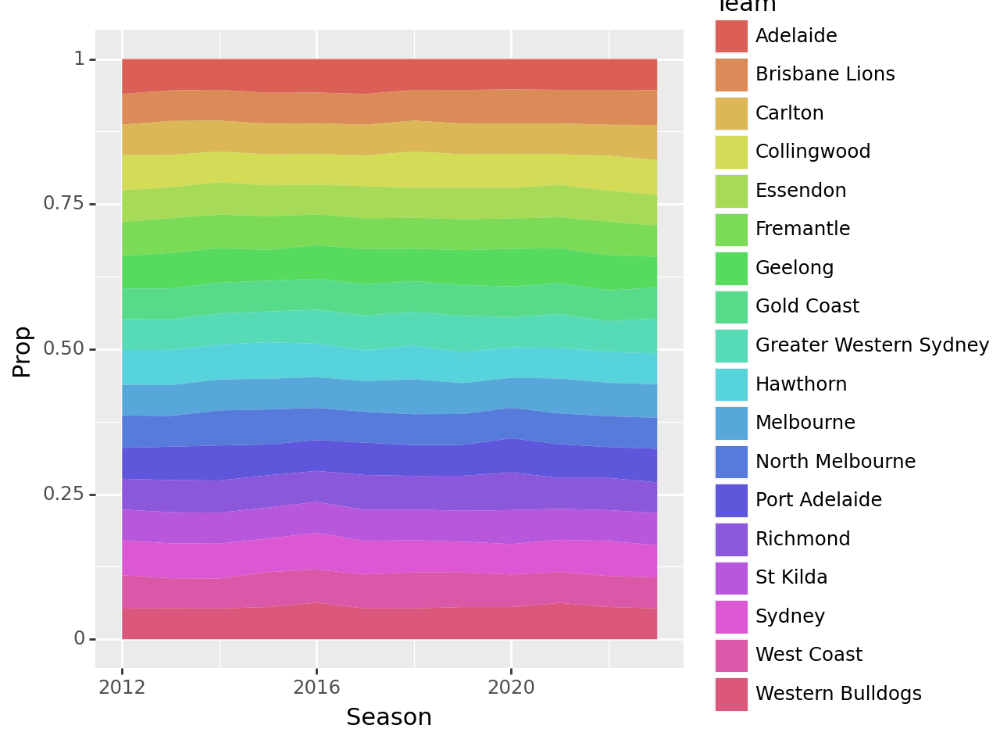

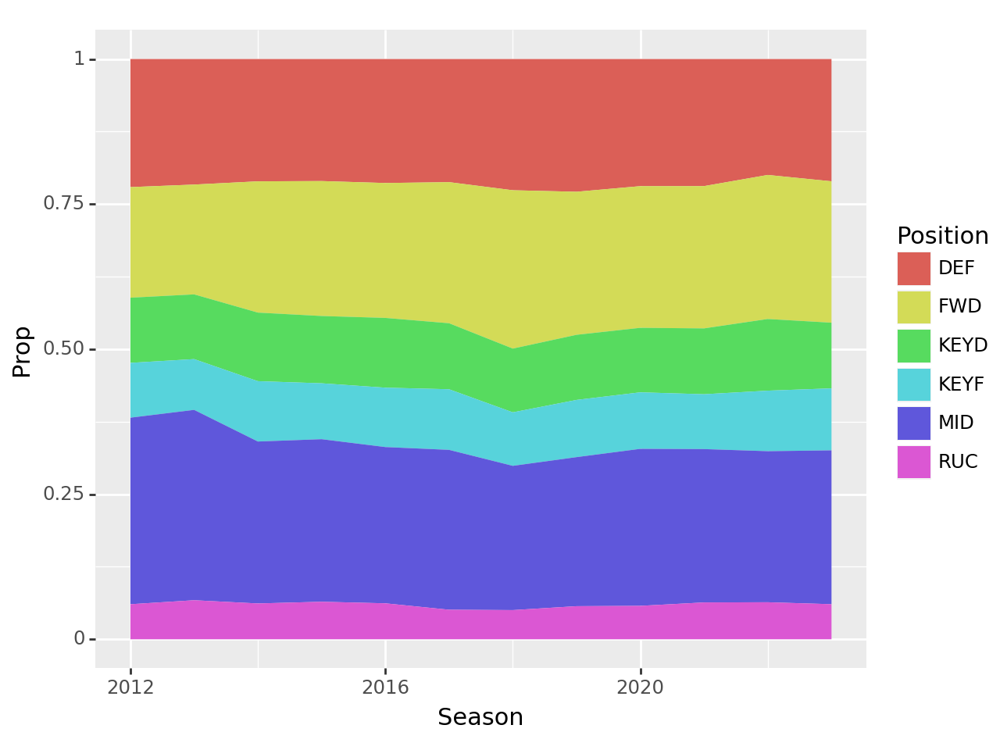

In [32]:
for var in cat_vars:
    df_season_counts = df_cats.groupby(['Season',var]).agg('count').groupby('Season').sum()['Player']
    df_areas = df_cats.groupby(['Season',var]).agg('count').reset_index().merge(df_season_counts,on='Season',how='left')\
        [['Season',var,'Player_x','Player_y']]
    
    df_areas['Prop'] = df_areas['Player_x']/df_areas['Player_y']
    
    #Find any Season where data is missing and insert this row (with prop 0)
    #get unique value of the variable
    var_set = set(list(df_areas[var].unique()))
    season_list = list(df_areas['Season'].unique())
    for seas in season_list:
        #Get the variables that appear for that season
        seas_set = set(list(df_areas[df_areas['Season']==seas][var].unique()))
        #Find the ones not appearing in the season
        miss_list = list(var_set - seas_set)
        df_miss = pd.DataFrame({'Season':[seas for i in range(len(miss_list))],
                                var:miss_list,'Prop':[0.0 for i in range(len(miss_list))]})
        #Add to the aggregate dataframe
        df_areas = pd.concat([df_areas,df_miss],ignore_index=True)

    print(
        ggplot(df_areas, aes(x='Season',y='Prop',fill=var))
        + geom_area()
    )

Categories appear normal. We note the largest positions are MID > FWD > DEF.

# Required Data Modifications

We have identified we should apply the following:
- Remove Jared Jansen where Team is NA.
- Remove 'lPlayer' column which was previously used for joining.
- Consolidate the 'Round' column with the 'Matches' dataset. Better to do this on Matches data.
- Create a new column for joining tables e.g. SeasRound = '2012 A1', '2012 FW1', '2012 FPF', '2012 FSF', '2012 FGF'.
- ToG% == 0 means player did not play in the match. Values shouldn't be used in the averages however this should be flagged as  a non play and kept in the data.
